## Decision Trees - Random Forest

Based on training-workshop course provided as part of Research IT at the University of Sheffield

Install all the required Python packages

In [4]:
#%pip install -r requirements.txt
%pip install pandas ipykernel ipython ipywidgets matplotlib notebook numpy scipy seaborn 

Note: you may need to restart the kernel to use updated packages.


# 1.Introduction

We will focus on the analysis of a small electronic health record (EHR) dataset. We'll use a small subset of the [Philips eICU Research Institute](https://eicu-crd.mit.edu) dataset that contains the data from around 1000 patients admitted to critical care units in the US. This data will be used to predict patient outcome using observations from the first day of a patient's admission to critical care.

An initial analysis of the data and investigation (and implementation) of the required data cleaning steps is done to use the data in tree-based models.

## Loading the data

We'll first load the data and perform a basic analysis - what features do we have available, what formats do these features take, is there any missing data etc. Use the [pandas](https://pandas.pydata.org) documentation to help you.

In [1]:
import pandas as pd

# Load the data
data = pd.read_csv("../Decision_Trees_Training_UoSheffield/eicu_cohort_trees.csv")

# Display the first 5 rows
data.head(5)


,gender,age,admissionweight,unabridgedhosplos,acutephysiologyscore,apachescore,actualhospitalmortality,heartrate,meanbp,creatinine,temperature,respiratoryrate,wbc,admissionheight
0,Female,48,86.4,27.5583,44,49,ALIVE,102.0,54.0,1.16,36.9,39.0,6.1,177.8
1,Female,59,66.6,15.0778,56,61,ALIVE,134.0,172.0,1.03,34.8,32.0,25.5,170.2
2,Male,31,66.8,2.7326,45,45,ALIVE,138.0,71.0,2.35,37.2,34.0,21.4,188.0
3,Female,51,77.1,0.1986,19,24,ALIVE,122.0,73.0,-1.00,36.8,26.0,-1.0,160.0
4,Female,48,63.4,1.7285,25,30,ALIVE,130.0,68.0,1.10,-1.0,29.0,7.6,172.7


We can see that the data 14 features:

In [2]:
# List all columns of the dataset
data.columns

Index(['gender', 'age', 'admissionweight', 'unabridgedhosplos',
       'acutephysiologyscore', 'apachescore', 'actualhospitalmortality',
       'heartrate', 'meanbp', 'creatinine', 'temperature', 'respiratoryrate',
       'wbc', 'admissionheight'],
      dtype='object')

For each of these features we need to know what type of data we have: are they integers, floats or categorical variables? We should also check for any missing or erroneous values - if we included these in our modelling, we could introduce biases into our decision trees.

For this task, we can use the `pandas-profiling` library. This will generate a report which we can then inspect to get a better understanding of our data.

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 536 entries, 0 to 535
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   gender                   536 non-null    object 
 1   age                      536 non-null    object 
 2   admissionweight          520 non-null    float64
 3   unabridgedhosplos        536 non-null    float64
 4   acutephysiologyscore     536 non-null    int64  
 5   apachescore              536 non-null    int64  
 6   actualhospitalmortality  536 non-null    object 
 7   heartrate                536 non-null    float64
 8   meanbp                   536 non-null    float64
 9   creatinine               536 non-null    float64
 10  temperature              536 non-null    float64
 11  respiratoryrate          536 non-null    float64
 12  wbc                      536 non-null    float64
 13  admissionheight          528 non-null    float64
dtypes: float64(9), int64(2), o

- Generally most of the data are floats, except, gender, age, actualhospitalmortality which are objects 
- Age might need to be changed from object to int or float
- It seems that the data has missing values in adminssionheigh and admissionweigh features

In [4]:
data.isnull().sum()

gender                      0
age                         0
admissionweight            16
unabridgedhosplos           0
acutephysiologyscore        0
apachescore                 0
actualhospitalmortality     0
heartrate                   0
meanbp                      0
creatinine                  0
temperature                 0
respiratoryrate             0
wbc                         0
admissionheight             8
dtype: int64

In [122]:
from ydata_profiling import ProfileReport

profile = ProfileReport(data)
profile


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Question:** What possible issues are in the data that we need to fix?

<details>
    <summary>Answers</summary>
There are multiple problems that are _needed_ to be fixed, and a couple of things we can do to make our lives easier. We'll start at the top of the report and work our way down:

- The `age` column appears to be text. Why is this? It's because patient's older than 89 are recorded as `> 89`. We'll fix this by replacing all `> 89` values with 91.5 (which is the average age of patients older than 89 in this cohort), and convert the column to an integer.
- The `admissionweight` and `admissionheight` columns have some missing data. We'll keep these in - the types of decision trees we are using can handle missing data - but it's worth noting.
- Our target column, `actualhospitalmortality`, is currently a string. We'll convert this to a binary (0/1) label for ease. Note that our data is also highly imbalanced.
- `acutephysiologyscore`, `apachescore`, `creatinine`, `temperature`, `respiratoryrate`, `wbc` all have values less than 0 - this is clinically not possible for these features. We'll convert these to missing data, by replacing them with `np.nan` (not a number)
    
   </details>

In [5]:
data.head(2)

,gender,age,admissionweight,unabridgedhosplos,acutephysiologyscore,apachescore,actualhospitalmortality,heartrate,meanbp,creatinine,temperature,respiratoryrate,wbc,admissionheight
0,Female,48,86.4,27.5583,44,49,ALIVE,102.0,54.0,1.16,36.9,39.0,6.1,177.8
1,Female,59,66.6,15.0778,56,61,ALIVE,134.0,172.0,1.03,34.8,32.0,25.5,170.2


In [6]:
data['age'].unique()

array(['48', '59', '31', '51', '79', '65', '86', '62', '75', '41', '> 89',
       '72', '69', '87', '76', '63', '84', '73', '74', '81', '55', '64',
       '83', '80', '52', '54', '21', '39', '50', '61', '77', '53', '89',
       '56', '44', '68', '70', '47', '67', '33', '49', '43', '42', '40',
       '37', '66', '57', '27', '18', '58', '38', '16', '60', '82', '29',
       '35', '78', '88', '71', '32', '17', '85', '22', '26', '20', '28',
       '23', '45', '34', '25', '46'], dtype=object)

In [7]:
# ---- Age - replace all values >89 with 91.5
data.replace({'age':'> 89'},91.5, inplace=True)

In [8]:
data['age'].unique()

array(['48', '59', '31', '51', '79', '65', '86', '62', '75', '41', 91.5,
       '72', '69', '87', '76', '63', '84', '73', '74', '81', '55', '64',
       '83', '80', '52', '54', '21', '39', '50', '61', '77', '53', '89',
       '56', '44', '68', '70', '47', '67', '33', '49', '43', '42', '40',
       '37', '66', '57', '27', '18', '58', '38', '16', '60', '82', '29',
       '35', '78', '88', '71', '32', '17', '85', '22', '26', '20', '28',
       '23', '45', '34', '25', '46'], dtype=object)

In [9]:
data['age'] = data['age'].astype(int) 

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 536 entries, 0 to 535
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   gender                   536 non-null    object 
 1   age                      536 non-null    int64  
 2   admissionweight          520 non-null    float64
 3   unabridgedhosplos        536 non-null    float64
 4   acutephysiologyscore     536 non-null    int64  
 5   apachescore              536 non-null    int64  
 6   actualhospitalmortality  536 non-null    object 
 7   heartrate                536 non-null    float64
 8   meanbp                   536 non-null    float64
 9   creatinine               536 non-null    float64
 10  temperature              536 non-null    float64
 11  respiratoryrate          536 non-null    float64
 12  wbc                      536 non-null    float64
 13  admissionheight          528 non-null    float64
dtypes: float64(9), int64(3), o

In [11]:
#Our target column, `actualhospitalmortality`, is currently a string. We'll convert this to a binary (0/1) label for ease. Note that our data is also highly imbalanced - we'll come to this later on in the workshop
data['actualhospitalmortality'].unique()

array(['ALIVE', 'EXPIRED'], dtype=object)

In [12]:
#data['actualhospitalmortality']=data[[]'actualhospitalmortality']
#benign_data = breast_cancer.loc[breast_cancer['diagnosis'] == 0]
actualhospitalmortality = {'ALIVE':0, 'EXPIRED':1}
data.actualhospitalmortality = [actualhospitalmortality[item] for item in data.actualhospitalmortality]
print(data)

     gender  age  admissionweight  unabridgedhosplos  acutephysiologyscore  \
0    Female   48            86.40            27.5583                    44   
1    Female   59            66.60            15.0778                    56   
2      Male   31            66.80             2.7326                    45   
3    Female   51            77.10             0.1986                    19   
4    Female   48            63.40             1.7285                    25   
..      ...  ...              ...                ...                   ...   
531    Male   46            87.00             2.9188                    15   
532    Male   25            99.79             0.7896                    23   
533    Male   60           106.10             0.7326                    32   
534  Female   33            72.50             0.7694                    44   
535  Female   41            59.90             2.7083                    21   

     apachescore  actualhospitalmortality  heartrate  meanbp  c

In [13]:
data

,gender,age,admissionweight,unabridgedhosplos,acutephysiologyscore,apachescore,actualhospitalmortality,heartrate,meanbp,creatinine,temperature,respiratoryrate,wbc,admissionheight
0,Female,48,86.40,27.5583,44,49,0,102.0,54.0,1.16,36.9,39.0,6.1,177.8
1,Female,59,66.60,15.0778,56,61,0,134.0,172.0,1.03,34.8,32.0,25.5,170.2
2,Male,31,66.80,2.7326,45,45,0,138.0,71.0,2.35,37.2,34.0,21.4,188.0
3,Female,51,77.10,0.1986,19,24,0,122.0,73.0,-1.00,36.8,26.0,-1.0,160.0
4,Female,48,63.40,1.7285,25,30,0,130.0,68.0,1.10,-1.0,29.0,7.6,172.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
531,Male,46,87.00,2.9188,15,20,0,101.0,70.0,-1.00,36.8,7.0,-1.0,175.3
532,Male,25,99.79,0.7896,23,23,0,102.0,125.0,1.00,36.1,34.0,12.1,69.0
533,Male,60,106.10,0.7326,32,43,0,99.0,117.0,0.90,36.6,49.0,12.7,182.9
534,Female,33,72.50,0.7694,44,44,0,100.0,148.0,-1.00,37.1,53.0,15.8,NaN


`acutephysiologyscore`, `apachescore`, `creatinine`, `temperature`, `respiratoryrate`, `wbc` all have values less than 0 - this is clinically not possible for these features. We'll convert these to missing data, by replacing them with `np.nan` (not a number)

In [14]:
import numpy as np

In [15]:
columns = ['acutephysiologyscore', 
           'apachescore',
           'creatinine', 
           'temperature', 
           'respiratoryrate',
           'wbc'
]

for col in columns:
    data[col].replace({col: lambda x: np.nan if x <= 0 else x}, inplace=True)


In [16]:
# Let's encode the target column as binary: 0 as alive, 1 as died
from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder()

data['actualhospitalmortality'] = encoder.fit_transform(data['actualhospitalmortality'])

In [17]:
#Let's now look at our data again to see how things have changed.
data.head()

,gender,age,admissionweight,unabridgedhosplos,acutephysiologyscore,apachescore,actualhospitalmortality,heartrate,meanbp,creatinine,temperature,respiratoryrate,wbc,admissionheight
0,Female,48,86.4,27.5583,44,49,0,102.0,54.0,1.16,36.9,39.0,6.1,177.8
1,Female,59,66.6,15.0778,56,61,0,134.0,172.0,1.03,34.8,32.0,25.5,170.2
2,Male,31,66.8,2.7326,45,45,0,138.0,71.0,2.35,37.2,34.0,21.4,188.0
3,Female,51,77.1,0.1986,19,24,0,122.0,73.0,-1.00,36.8,26.0,-1.0,160.0
4,Female,48,63.4,1.7285,25,30,0,130.0,68.0,1.10,-1.0,29.0,7.6,172.7


In [18]:
profile_new = ProfileReport(data)
profile_new

NameError: name 'ProfileReport' is not defined

Our data is now in a format we can work with going forward - we'll save this in a new file so we can easily load it later on.

In [19]:
data.to_csv('eicu_processed.csv')

Inspection of the dataset to get an understanding of each of the features. Some of this may require extra research. For example:

- What is the Apache score?
- What is the acute physiology score?
- What is the median age of our data?

#### missing data

In [20]:
data.describe()

,age,admissionweight,unabridgedhosplos,acutephysiologyscore,apachescore,actualhospitalmortality,heartrate,meanbp,creatinine,temperature,respiratoryrate,wbc,admissionheight
count,536.000000,520.000000,536.000000,536.000000,536.000000,536.000000,536.000000,536.000000,536.000000,536.000000,536.000000,536.000000,528.000000
mean,63.365672,81.800500,5.595951,41.712687,53.643657,0.089552,101.526119,89.597015,0.820993,35.607127,27.406716,6.540989,168.381515
std,17.380316,24.963451,6.836070,22.698996,25.137712,0.285806,32.911539,41.456406,1.991848,5.594137,15.540681,7.625355,14.514435
min,16.000000,29.900000,0.198600,-1.000000,-1.000000,0.000000,23.000000,40.000000,-1.000000,-1.000000,-1.000000,-1.000000,1.600000
25%,53.000000,63.577500,2.084875,26.000000,36.000000,0.000000,89.000000,55.000000,-1.000000,36.200000,12.000000,-1.000000,160.000000
50%,64.000000,77.100000,3.776750,37.000000,49.000000,0.000000,105.000000,68.000000,0.800000,36.500000,29.000000,6.250000,167.600000
75%,77.000000,95.500000,6.379725,51.250000,66.000000,0.000000,122.000000,126.250000,1.300000,36.700000,38.000000,11.100000,175.300000
max,91.000000,227.700000,93.045100,162.000000,173.000000,1.000000,202.000000,199.000000,20.200000,40.200000,60.000000,39.500000,297.180000


# 2. The simplest tree

Let’s build the simplest tree model we can think of: a classification tree with only one split. Decision trees of this form are commonly referred to under the umbrella term Classification and Regression Trees (CART) [1]. For this initial investigation, we'll be attempting to predict patient mortality using only the `age` and `acutephysiologyscore` features.

While we will only be looking at classification here, regression isn’t too different. After grouping the data (which is essentially what a decision tree does), classification involves assigning all members of the group to the majority class of that group during training. Regression is the same, except you would assign the average value, not the majority.

In the case of a decision tree with one split, often called a “stump”, the model will partition the data into two groups, and assign classes for those two groups based on majority vote. There are many parameters available for the `DecisionTreeClassifier` class; by specifying `max_depth=1` we will build a decision tree with only one split - i.e. of depth 1.

As this is a simple decision tree, we will use the tree module of the `sklearn` Python package. Later  we will move onto more advanced techniques from different libraries. 

[1] L. Breiman, J. Friedman, R. Olshen, and C. Stone. Classification and Regression Trees. Wadsworth, Belmont, CA, 1984.

Let's begin by loading our processed data and re-creating our train/test splits from the previous workbook.

In [21]:
from sklearn.model_selection import train_test_split

outcome = 'actualhospitalmortality'


# For this study, we only want age and acutephysiologyscore
features = ['age', 'acutephysiologyscore']

x = data[features]
y = data[outcome]

x_train, x_test, y_train, y_test = train_test_split(x, y, train_size = 0.7, random_state = 42)

In [22]:
x_train.shape

(375, 2)

In [23]:
x_test.shape

(161, 2)

In [24]:
y_train.shape

(375,)

In [25]:
y_test.shape

(161,)

**Task:** Create a tree with `max_depth=1`. Use the [sklearn documentation](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html) to help.

In [26]:
from sklearn import tree
# for visualisation
import matplotlib.pyplot as plt
from sklearn.tree import export_graphviz
from IPython.display import Image  
from subprocess import call
# specify max_depth=1 so we train a stump, i.e. a tree with only 1 split
model = tree.DecisionTreeClassifier(random_state=42, max_depth=1)


In [27]:
# fit the model to the data - trying to predict y from X
model = model.fit(x_train, y_train)

Because our tree is a stump, and we only have two predictor variables, we can easily visualise it.

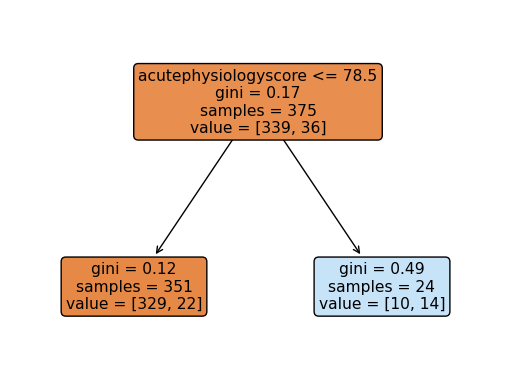

In [28]:
graphviz_installed = False


if (graphviz_installed):
  export_graphviz(model, out_file='simple_tree.dot', 
                  feature_names = features,
                  rounded = True, proportion = False, 
                  precision = 2, filled = True)
  
  # Convert to png using system command
  call(['dot', '-Tpng', 'simple_tree.dot', '-o', 'simple_tree.png', '-Gdpi=600'])
  
else: 
  fig = plt.figure()
  tree.plot_tree(model,feature_names = features, 
                     rounded = True, proportion = False, 
                     precision = 2, filled = True) #display tree

  
#tree.plot_tree(model, feature_names=features)

- With gini coefficient we can get the probabilities if needed

Here we see three nodes: a node at the top, a node in the lower left, and a node in the lower right.

The top node is the root of the tree: it contains all the data. Let’s read this node bottom to top:

- `value = [339, 36]`: Current class balance. There are 339 observations of class 0 and 36 observations of class 1.
samples = 375: Number of samples assessed at this node.
- `gini = 0.174`: Gini impurity, a measure of “impurity”. The higher the value, the bigger the mix of classes. A 50/50 split of two classes would result in an index of 0.5.
- `acutePhysiologyScore <=78.5`: Decision rule learned by the node. In this case, patients with a score of <= 78.5 are moved into the left node and >78.5 to the right.

The gini impurity is actually used by the algorithm to determine a split. The model evaluates every feature (in our case, age and score) at every possible split (46, 47, 48..) to find the point with the lowest gini impurity in two resulting nodes.

The approach is referred to as “greedy” because we are choosing the optimal split given our current state. Let’s take a closer look at our decision boundary.

In [29]:
%pip install utils

Note: you may need to restart the kernel to use updated packages.


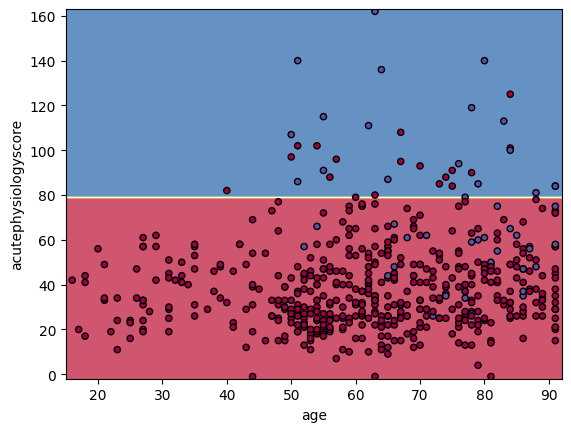

In [30]:
from sklearn.inspection import DecisionBoundaryDisplay
%matplotlib inline
# Plot the decision boundaries
ax = plt.subplot()

DecisionBoundaryDisplay.from_estimator(model, x, cmap=plt.cm.Spectral, ax=ax, 
                                       response_method="predict", alpha = 0.8)

ax.scatter(x['age'], x['acutephysiologyscore'], c=y, cmap=plt.cm.Spectral , s=20, edgecolor="k")
plt.show()

In this plot we can see the decision boundary on the y-axis, separating the predicted classes. The true classes are indicated at each point. Where the background and point colours are mismatched, there has been misclassification. Of course we are using a very simple model.

Throughout the few workbooks, we'll be looking at different types of decision trees, all of which are implemented in the `sklearn` Python package. Take some time to familiarise yourself with the [documentation](https://scikit-learn.org/stable/modules/tree.html).

In [47]:
#!pip show requests
#!pip uninstall --yes utils
#!pip install python-utils
!pip install utils


  Using cached utils-1.0.2-py2.py3-none-any.whl


In [31]:
#import utils
#from utils import plot_tree_boundaries
#import package.utils.plot_tree_bounadries

#plot_tree_boundaries(model, x_test, y_test, features, ['Alive', 'Dead'])

- It missclassifies a few values

In this plot we can see the decision boundary on the y-axis, separating the predicted classes. The true classes are indicated at each point. Where the background and point colours are mismatched, there has been misclassification. Of course we are using a very simple model.

Throughout the few workbooks, we'll be looking at different types of decision trees, all of which are implemented in the `sklearn` Python package. To familiarise with the lib, refer to the [documentation](https://scikit-learn.org/stable/modules/tree.html).

# 1.Introduction

Variance and Overfitting

In [32]:
import pandas as pd
from sklearn.model_selection import train_test_split

features = ['age','acutephysiologyscore']
outcome = 'actualhospitalmortality'

data = pd.read_csv('eicu_processed.csv')

x = data[features]
y = data[outcome]

x_train, x_test, y_train, y_test = train_test_split(x, y, train_size = 0.7, random_state =  42)

# Larger Depth Trees

Previously we created a very simple decision tree. Let’s see what happens when we introduce new decision points by increasing the depth.

**Task:** Using the template code from the previous workbook, and the [sklearn documentation](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html#sklearn.tree.DecisionTreeClassifier), train a decision tree with `max_depth` of 5. Plot the decision tree using `plot_tree_boundaries`.

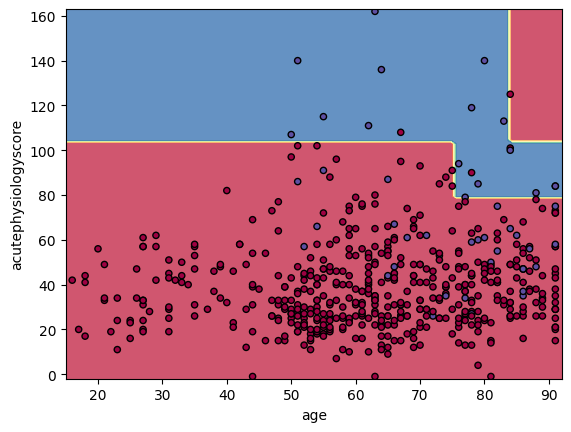

In [33]:
from sklearn import tree
import matplotlib.pyplot as plt

# train model
model = tree.DecisionTreeClassifier(random_state=42, max_depth=3)
model = model.fit(x_train,y_train)
# plot tree
ax = plt.subplot()

DecisionBoundaryDisplay.from_estimator(model, x, cmap=plt.cm.Spectral, ax=ax, 
                                       response_method="predict", alpha = 0.8)
ax.scatter(x['age'], x['acutephysiologyscore'], c=y, cmap=plt.cm.Spectral , s=20, edgecolor="k")
plt.show()



Now our tree is more complicated! We can see a few vertical boundaries as well as the horizontal one from before. Some of these we may like, but some appear unnatural. Let’s look at the tree itself.

<Figure size 640x480 with 0 Axes>

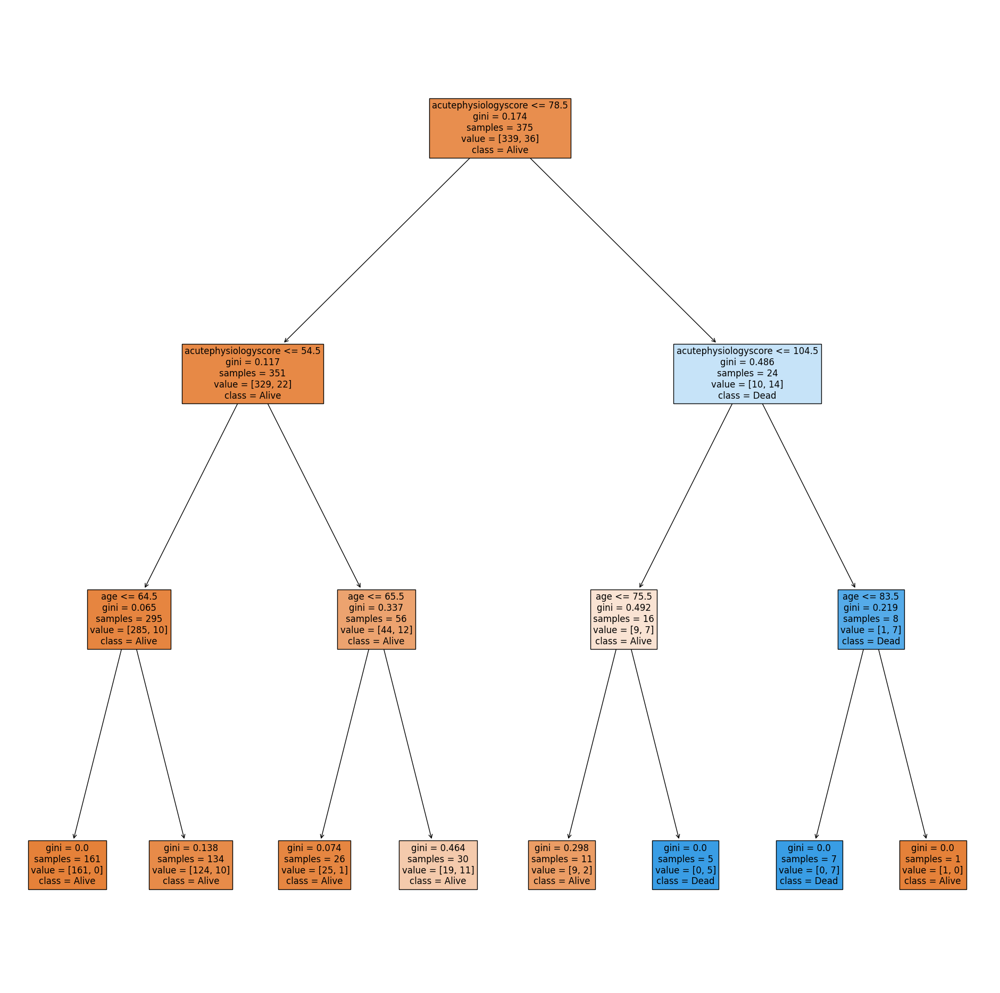

In [34]:
plt.clf()
plt.figure(figsize=(24, 24))
tree.plot_tree(model, filled=True, feature_names=features, class_names=['Alive', 'Dead'], fontsize=12)
plt.show()

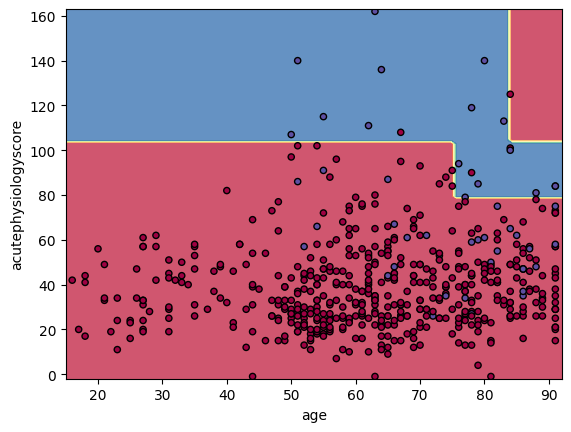

In [35]:
# plot tree
ax = plt.subplot()

DecisionBoundaryDisplay.from_estimator(model, x, cmap=plt.cm.Spectral, ax=ax, 
                                       response_method="predict", alpha = 0.8)
ax.scatter(x['age'], x['acutephysiologyscore'], c=y, cmap=plt.cm.Spectral , s=20, edgecolor="k")
plt.show()

- overfitting looks like this: because the dataset is small and the model is quite powerfull and remembers the data and thus it cannot be generalised well in unseen data

Looking at the tree, we can see that there are some very specific sets of rules - e.g., there are some leaves with only 1 or 2 samples.

**Question:** Consider a patient aged 45 years with an acute physiology score of 100. Using the image of the tree, work through the nodes until your can make a prediction. What outcome does your model predict?

**Question:** What is the gini impurity of the final node, and why?
gini impurity for the last node = 0 cause we have only 1 sample

**Question:** Does the decision that led to this final node seem sensible Why?

This specifcity shows that our model is overfitting to the training data. Overfitting is a problem that occurs when our algorithm is too closely aligned to our training data, and often occurs when we use a powerful technique to model simple data.

The result is that the model may not generalise well to “unseen” data, such as observations for new patients entering a critical care unit - the model knows what to do in settings that closely follow the training data, but has no knowledge of data outside of this very narrow distribution. 

There are techniques we can employ that try to address this problem. This is where “pruning” comes in.

## Pruning

This might decrease the accuracy on the training data but ultimately it will be better in general dataset
Let's run pruning, run the model again and see what it does.

**Task:** Look at the sklearn documentation, and train a decision tree with `max_depth` and `min_samples_leaf` of 5.

<Figure size 640x480 with 0 Axes>

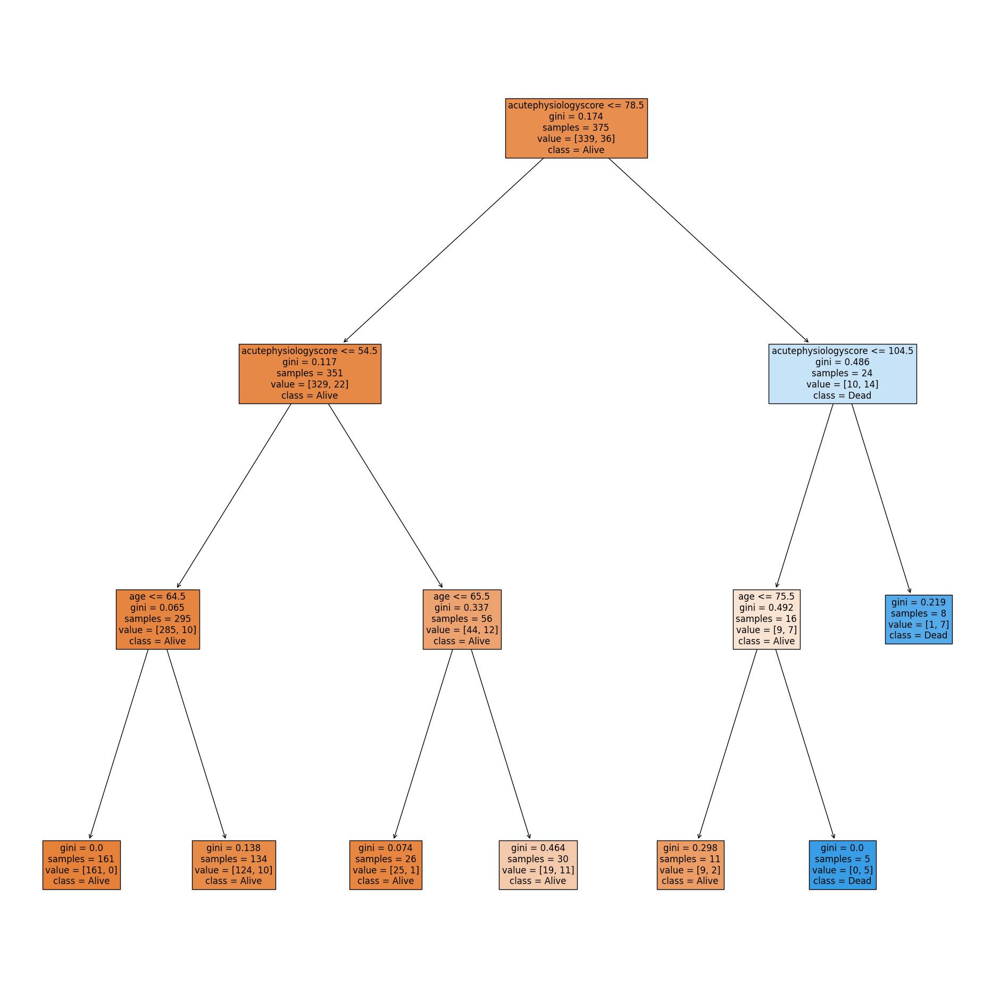

In [36]:
# train model
model = tree.DecisionTreeClassifier(random_state=42, 
                                    max_depth=3,
                                    min_samples_leaf= 5)

model = model.fit(x_train,y_train)
# Plot tree
plt.clf()
plt.figure(figsize=(24, 24))
tree.plot_tree(model, filled=True, feature_names=features, class_names=['Alive', 'Dead'], fontsize=12)
plt.show()

**Question:** Compare the new tree to the previous one - what's different?

We can see that our second tree is (1) smaller in depth, and (2) never splits a node with <= 10 samples. We can look at the decision surface for this tree:

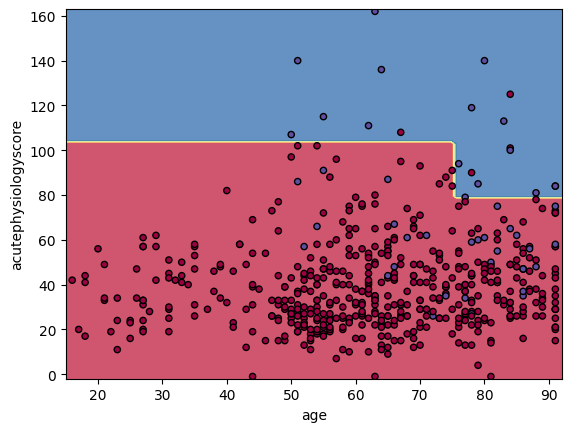

In [37]:
# plot tree
ax = plt.subplot()

DecisionBoundaryDisplay.from_estimator(model, x, cmap=plt.cm.Spectral, ax=ax, 
                                       response_method="predict", alpha = 0.8)
ax.scatter(x['age'], x['acutephysiologyscore'], c=y, cmap=plt.cm.Spectral , s=20, edgecolor="k")

Our pruned decision tree has a more intuitive boundary, but does make some errors. We have reduced our performance in an effort to simplify the tree. This is the classic machine learning problem of trading off complexity with error.

Note that, in order to do this, we “invented” the minimum samples per leaf node of 10. Why 10? Why not 5? Why not 20? The answer is: it depends on the dataset. Heuristically choosing these parameters can be time consuming, and we will see later on how gradient boosting elegantly handles this task.

## Decisions trees have "high variance"

Decision trees have high “variance”. In this context, variance refers to a property of some models to have a wide range of performance given random samples of data. Let’s take a look at randomly slicing the data we have to see what that means.

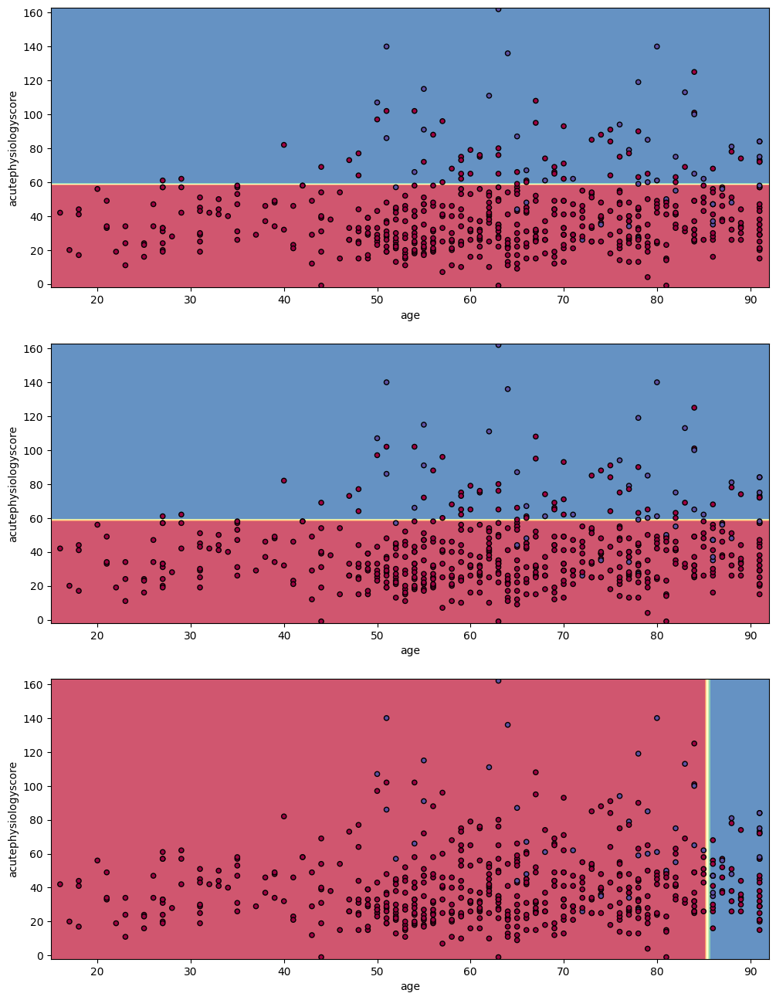

In [41]:
import numpy as np

np.random.seed(123)

fig = plt.figure(figsize=[12,16])
    

#Train on a random 50 train samples 
for i in range(3):
    # generate indices in a random order
    idx = np.random.permutation(x_train.shape[0])
    
    # only use the first 50
    idx = idx[:50]
    x_temp = x_train.iloc[idx]
    y_temp = y_train.values[idx]
    
    # initialize the model
    model = tree.DecisionTreeClassifier(random_state=42, 
                                    max_depth=5,
                                    min_samples_leaf= 5)

    
    ax = plt.subplot(3,1,i+1)
    # train the model using the dataset
    model = model.fit(x_temp, y_temp)
    

    
    DecisionBoundaryDisplay.from_estimator(model, x, cmap=plt.cm.Spectral, ax=ax, 
                                           response_method="predict", alpha = 0.8)
    plt.scatter(x['age'], x['acutephysiologyscore'], c=y, cmap=plt.cm.Spectral , s=20, edgecolor="k")

- If we get multiple weak learners, they can be combined to create a strong learner

Above we can see that we are using random subsets of data, and as a result, our decision boundary can change quite a bit. As you could guess, we actually don’t want a model that randomly works well and randomly works poorly.

There is an old joke: two farmers and a statistician go hunting. They see a deer: the first farmer shoots, and misses to the left. The next farmer shoots, and misses to the right. The statistician yells “We got it!!”.

While it doesn’t quite hold in real life, it turns out that this principle does hold for decision trees. Combining them in the right way ends up building powerful models.

**Question:** Why are decision trees considered have high variance?

**Question:** An “ensemble” is the name used for a machine learning model that aggregates the decisions of multiple sub-models. Why might creating ensembles of decision trees be a good idea?